# DynaGen: Predicting Dynamical Evolution of Data Fields using an Attention-based Diffusion Model

Dynamic fracture is an important area of materials analysis, assessing the atomic-level mechanisms by which materials fail over time. Here, we focus on brittle materials failure and show that an atomistically derived progressive transformer diffusion machine learning model can effectively describe the dynamics of fracture, capturing important aspects such as crack dynamics, instabilities, and initiation mechanisms. Trained on a small dataset of atomistic simulations, the model generalizes well and offers a rapid assessment of dynamic fracture mechanisms for complex geometries, expanding well beyond the original set of atomistic simulation results. Various validation cases, progressively more distinct from the data used for training, are presented and analyzed. The validation cases feature distinct geometric details, including microstructures generated by a generative neural network used here to identify novel bio-inspired material designs for mechanical performance. For all cases, the model performs well and captures key aspects of material failure.Dynamic fracture is an important area of materials analysis, assessing the atomic-level mechanisms by which materials fail over time. Here, we focus on brittle materials failure and show that an atomistically derived progressive transformer diffusion machine learning model can effectively describe the dynamics of fracture, capturing important aspects such as crack dynamics, instabilities, and initiation mechanisms. Trained on a small dataset of atomistic simulations, the model generalizes well and offers a rapid assessment of dynamic fracture mechanisms for complex geometries, expanding well beyond the original set of atomistic simulation results. Various validation cases, progressively more distinct from the data used for training, are presented and analyzed. The validation cases feature distinct geometric details, including microstructures generated by a generative neural network used here to identify novel bio-inspired material designs for mechanical performance. For all cases, the model performs well and captures key aspects of material failure.

### Reference: 

[1] M.J. Buehler, Modeling Atomistic Dynamic Fracture Mechanisms Using a Progressive Transformer Diffusion Model, J. Appl. Mech., 89(12): 121009, 2022.

URL: https://asmedigitalcollection.asme.org/appliedmechanics/article-abstract/89/12/121009/1146377/Modeling-Atomistic-Dynamic-Fracture-Mechanisms 


The model takes an input microstructure and uses it to predict a series of frames of a field. In the paper [1], the model was applied to model brittle fracture, trained on atomistic simulation data

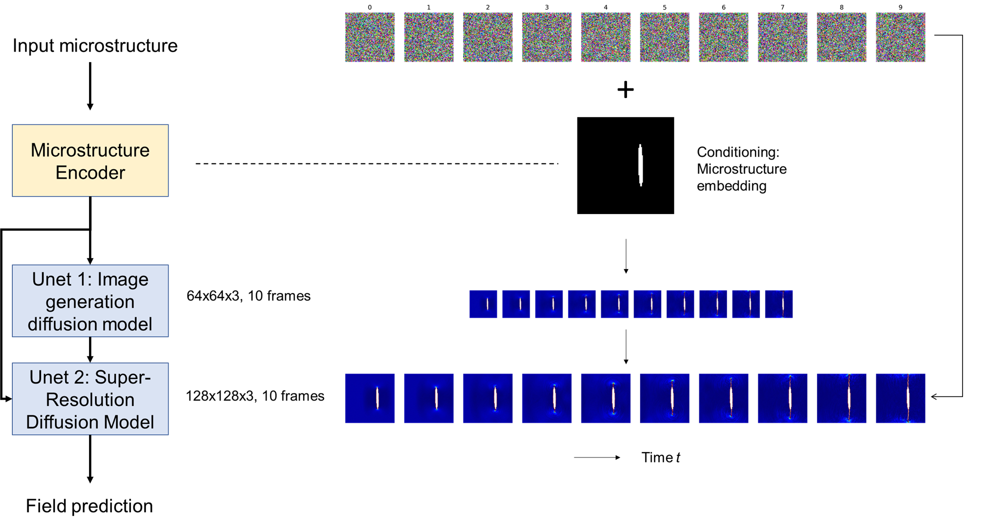

The model uses a diffusion model to learn how microstructure embeddings relate to dynamical field evolutions. This is accomplished via an attention-based denoising model.


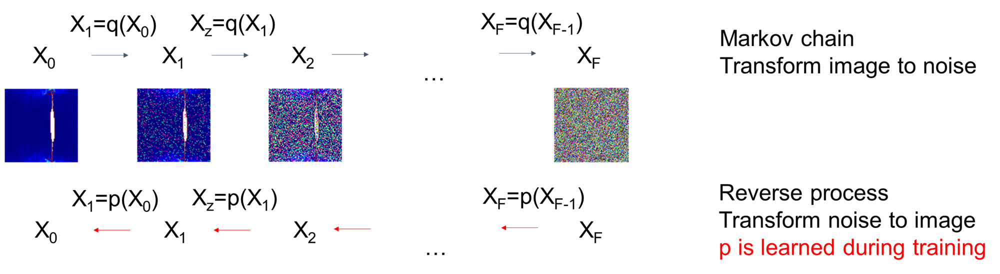

## Load libraries, incl. PyTorch, etc.

In [4]:
import os,sys
import math
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [5]:
import torch
 
import torchvision
 
import matplotlib.pyplot as plt
import numpy as np
 
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models

import torch.optim as optim
from torch.optim.lr_scheduler import ExponentialLR, StepLR
from sklearn.metrics import r2_score

print("Torch version:", torch.__version__) 

Torch version: 1.13.1+cu117


In [6]:
CPUonly=False
device = torch.device("cuda" if torch.cuda.is_available() 
                                  else "cpu")

if CPUonly == True:
     print ("CPU!")
     device = torch.device("cpu")

print("Device used: ", device)

Device used:  cuda


In [7]:

from torch.utils.data import DataLoader,Dataset
from torchvision.io import read_image
import pandas as pd
from sklearn.model_selection import train_test_split

from PIL import Image

import time
to_pil = transforms.ToPILImage()

#from tqdm.notebook import tqdm
from tqdm.auto import tqdm

LARGE_NUMBER = 9999999

In [8]:
from DynaGen import Unet, DynaGen, DynaGenTrainer

In [9]:
def exists(val):
    return val is not None

import matplotlib.pyplot as plt
import PIL 
from PIL import ImageChops, ImageOps, Image
import matplotlib as mpl
import numpy as np
import cv2
import pickle

In [10]:
!nvidia-smi -L

GPU 0: Quadro RTX 5000 (UUID: GPU-d58481d2-7149-5c2f-c46b-9f2d965751b2)


## Overall parameters

In [11]:
#Batch size used for training (and sampling of test data)
#batch_size_=3
batch_size_=1

#Image sizes for the various stages
#im_res_step1: First generated frames
#im_res_final: Final generated frames
im_res_step1=64
im_res_final = 128

number_frames = 10

prefix = './dynagen_output_1/'
 
if not os.path.exists(prefix):
        os.mkdir (prefix)
lossfile=prefix+'/lossfile.txt'  

## Load DynaGen libraries

In [12]:
import torch
from DynaGen import Unet3D, ElucidatedDynaGen, DynaGenTrainer

In [23]:
def count_parameters (model):

    pytorch_total_params = sum(p.numel() for p in model.parameters())
    pytorch_total_params_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print ("----------------------------------------------------------------------------------------------------")
    print ("Total parameters: ", pytorch_total_params," trainable parameters: ", pytorch_total_params_trainable)
    print ("----------------------------------------------------------------------------------------------------")
    for i in range (len (model.unets)):

        pytorch_total_params = sum(p.numel() for p in model.unets[i].parameters())
        pytorch_total_params_trainable = sum(p.numel() for p in model.unets[i].parameters() if p.requires_grad)

        print (f"Total parameters in unet {i}: ", pytorch_total_params," trainable parameters: ", pytorch_total_params_trainable)
    print ("----------------------------------------------------------------------------------------------------")
    return

## Data loader

In [14]:
data_dir = './'

cut='XXXXXXX.png'  #format of images
lcut=len (cut)
print (lcut)

class ImageDataset_ImagePairs(Dataset):
    def __init__(self,paths,paths2,frames,transform):
        self.paths=list(paths)
        self.paths2=list(paths2)
        self.frames=list(frames)
        self.transform=transform
    #The __len__ function returns the number of samples in our dataset.
    def __len__(self):
        return len(self.paths)

    def __getitem__(self,index):
        
        im1_pil = Image.open(data_dir+self.paths[index]).convert('RGB')#Image.fromarray(image1)

        image1=self.transform(im1_pil)
        image1=image1.unsqueeze (1).repeat(1,self.frames[index],1,1) #inut needs tp have same number of frames...
        
        for i in range (self.frames[index]):
            sel=self.paths2[index] [:len (self.paths2[index])-lcut]
           
            targetframe=sel+f'{i:07d}.png'
            im2_pil = Image.open(data_dir+targetframe).convert('RGB')#Image.fromarray(image2)
            image2=self.transform(im2_pil)
            
            if i==0: #first frame
                image2_list=image2.unsqueeze (1) #create time/video frame dimension
            else:
                image2_list=torch.cat( (image2_list, image2.unsqueeze (1)),1)
        
        return (image1, image2_list)
    
def ImagePairs_load_split_train_test(csvfile, valid_size = .2, im_res=256, batch_size_=16):
    train_transforms = transforms.Compose([#transforms.RandomRotation(30),  # data augmentations are great
                                       #transforms.RandomResizedCrop(224),  # but not in this case of map tiles
                                       #transforms.RandomHorizontalFlip(),
                                        transforms.Resize((im_res,im_res)),
                                           #transforms.Normalize([0.485, 0.456, 0.406],  
                                           #                  [0.229, 0.224, 0.225]),
                                       transforms.ToTensor(),
                                           #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                           #transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
                                       ])
    test_transforms = transforms.Compose([#transforms.RandomRotation(30),  # data augmentations are great
                                       #transforms.RandomResizedCrop(224),  # but not in this case of map tiles
                                       #transforms.RandomHorizontalFlip(),
                                        transforms.Resize((im_res,im_res)),
                                           #transforms.Normalize([0.485, 0.456, 0.406],  
                                           #                  [0.229, 0.224, 0.225]),
                                       #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                       transforms.ToTensor(),
                                          # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                          #transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
                                       ])
    frames=number_frames #number of frames
    df=pd.read_csv(csvfile)
    img=df["original_file"]
    imgpair=df["target_file"]
    frames=df["frames"]
    
    X_train, X_test, y_train, y_test, frames_train, frames_test =train_test_split(img,imgpair,frames,
                                                                                  test_size=valid_size, random_state=1)
    
    train_data=ImageDataset_ImagePairs(X_train,y_train,frames_train,train_transforms)
    test_data=ImageDataset_ImagePairs(X_test,y_test,frames_test,test_transforms)
    trainloader = torch.utils.data.DataLoader(train_data, batch_size=batch_size_)

    testloader = torch.utils.data.DataLoader(test_data, batch_size=batch_size_)
    return trainloader, testloader

#csvfile = './dynamic_fracture_images/data_631.csv'
csvfile = './dynamic_fracture_images/data_631_small.csv'

trainloader, testloader = ImagePairs_load_split_train_test(csvfile, 0.1, im_res=im_res_step1, batch_size_=batch_size_)

print ("Number of training batches: ", len(trainloader), "batch size= ", batch_size_, "total: ",len(trainloader)*batch_size_ )
print ("Number of test batches: ", len(testloader), "batch size= ", batch_size_, "total: ",len(testloader)*batch_size_)

print("TOTAL images (account for full batches): ", len(trainloader)*batch_size_+len(testloader)*batch_size_ )

11
Number of training batches:  47 batch size=  1 total:  47
Number of test batches:  6 batch size=  1 total:  6
TOTAL images (account for full batches):  53


## Sample images and other helper functions

In [15]:
#predict from input image file, and compare to GT image, also provided as image file
def predict_from_input (model, fname='./DataSet_mosaic/input_mobile00067.png',unet_number=1, 
                        tag=0,  im_res=256,
                       hide_axes_when_sampling=False,font_size=8.,base_fig_size=2.,
                        show_native_input=False,  gt=None,
                       plotcompare=False, delta_steps_disc=6,
                       cond_scale=1.,
                          skip_steps=0,
                       ):

    img_transform = transforms.Compose([#transforms.RandomRotation(30),  # data augmentations are great
                                           #transforms.RandomResizedCrop(224),  # but not in this case of map tiles
                                           #transforms.RandomHorizontalFlip(),
                                            transforms.Resize((im_res,im_res)),
                                               #transforms.Normalize([0.485, 0.456, 0.406],  
                                               #                  [0.229, 0.224, 0.225]),
                                           transforms.ToTensor(),
                                               #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                               #transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
                                           ])
    im2_pil = Image.open(fname).convert('RGB')
    cond_image=img_transform(im2_pil)
   
    cond_image=cond_image.unsqueeze (1).repeat(1,number_frames,1,1) 

    cond_image =  cond_image.unsqueeze(0).to(device)
    images = model.sample( cond_images= cond_image ,  stop_at_unet_number = unet_number,
                         video_frames = number_frames,
                         cond_scale=cond_scale,
                            skip_steps=  skip_steps,
                         )

    #generate figure to plot results
    plt.rc('font', size=font_size)
    plt.rc('axes', titlesize=font_size)

    figure, axis = plt.subplots(number_frames, 2, figsize=(2*base_fig_size,1.15*base_fig_size*number_frames))
    
    axis[0,0].imshow(cond_image[0,:,0,:,:].squeeze().permute(1, 2, 0).cpu().numpy())
    axis[0,0].set_title ('Input')

    print (axis.shape)

    for iiframe in range (number_frames):
        image = to_pil( images[0,:,iiframe,:,:].cpu()  )

        #make sure left column is empty 
        axis[iiframe,0].axis('off')

        axis[iiframe,1].imshow(image)
        axis[iiframe,1].set_title (f'Predict frame {iiframe}')

        if hide_axes_when_sampling:
            axis[iiframe,1].axis('off')
            #axis[iiframe,2].axis('off')

        figure.savefig(f'{prefix}/comp_sample{tag}_unet-{unet_number}.png')
   
    plt.show()
    
    ############################################################################################################
    ######################### Now analyze LAST frame (which will be compared to GT #############################
    ############################################################################################################
    frame_to_analyze=number_frames
    image = to_pil( images[0,:,frame_to_analyze-1,:,:].cpu()  )
    
    if gt == None:
        figure, axis = plt.subplots(1, 2, figsize=(8, 4))
    else:
        #if show native original have 5 suboplots. otherwitse 4
        if show_native_input:
            figure, axis = plt.subplots(1, 5, figsize=(20, 4))
            if hide_axes_when_sampling:
                 axis[0:5].axis('off')    
        else:
            figure, axis = plt.subplots(1, 4, figsize=(16, 4))
            if hide_axes_when_sampling:
                 axis[0:4].axis('off')    
                    
    axis[0].imshow(im2_pil, interpolation='None')
    axis[0].set_title ('Input')
    
    axis[1].imshow(image, interpolation='None')
    axis[1].set_title ('Prediction')
 
    if gt != None:
        
        if show_native_input: 
            im2_pil_gt = Image.open(gt).convert('RGB')
            axis[3].imshow(im2_pil_gt, interpolation='None')
            axis[3].set_title ('GT')
            final_plot_=4
        else: 
            final_plot_=3

        res_pred, _ = image.size
        
        print (f"Resolution of predicted image: {res_pred}")
        im2_pil_gt = Image.open(gt).convert('RGB')
        im2_pil_gt=im2_pil_gt.resize ( (res_pred,res_pred) )
        axis[2].imshow(im2_pil_gt, interpolation='None')
        axis[2].set_title ('Ground truth')
 
        diff = ImageChops.difference(im2_pil_gt, image)

        diff_g = ImageOps.grayscale(diff)
     
        diff_g=np.array(diff_g)/255.
        
        norm = mpl.colors.Normalize(vmin=0, vmax=1)
        
        pcm=axis[final_plot_].imshow(diff_g  , cmap='magma',  aspect='equal',
                                     #vmin = 0,
                                     #vmax = 1,
                                     norm=norm,
                                    )
        axis[final_plot_].set_title ('Absolute error')
        plt.colorbar(pcm, ax=axis[final_plot_], shrink=1.)
                
    figure.savefig(f'{prefix}/sampling-comp-{tag}.png', dpi=300 )    
    plt.show() 
    
    ############################################################################################################
    # NOW PRODUCE SLICES/2D plots to compare
    ############################################################################################################
    if gt != None:
        if plotcompare:
            maxx=255.
            for ijkk in range (0, res_pred, delta_steps_disc):
                image_=np.array (ImageOps.grayscale(image))
                im2_pil_gt_=np.array( ImageOps.grayscale(im2_pil_gt))
                figure, axis = plt.subplots(1, 1, figsize=(3, 3) )
                plt.plot (image_[ijkk, :]/maxx, label ='Prediction')
                plt.plot (im2_pil_gt_[ijkk, :]/maxx, label ='Ground truth')
                plt.title (f'Slice at j={ijkk}')
                plt.xlabel ('i')
                plt.legend()
                plt.ylim(0,1)
                plt.show()
                im2_pil_gt_=np.array( ImageOps.grayscale(im2_pil_gt))
                figure, axis = plt.subplots(1, 1, figsize=(3, 3) )
                plt.plot (image_[:,ijkk]/maxx, label ='Prediction')
                plt.plot (im2_pil_gt_[:,ijkk]/maxx, label ='Ground truth')
                plt.title (f'Slice at i={ijkk}')
                plt.legend()
                plt.xlabel ('j')
                plt.ylim(0,1)
                plt.show()

    if gt != None:
        return np.array(image) , np.array(im2_pil_gt), images
    
    return np.array(image), images

In [16]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.144])

def stat_analysis (GT, pred, nbins=35, 
                   flag = -1):

    GT=  rgb2gray(GT)
    
    pred=  rgb2gray(pred)
    
    plt.hist([GT.flatten()/255.,pred.flatten()/255.], bins = nbins, density=True,label=['Ground truth','Prediction'],)
   
    plt.legend()
    plt.yscale('log')
    
    plt.xlabel ('Field intensity')
    plt.ylabel ('Count')
    
    if flag>0:
        figure.savefig(f'{prefix}/histogram-comp-{flag}.png', dpi=300 )  
  
    plt.show()
    
    stddev_GT=np.std(GT.flatten())/255.
    stddev_pred=np.std(pred.flatten())/255.
    
    var_GT=np.var(GT.flatten())/255.
    var_pred=np.var(pred.flatten())/255.
    
    print (f"Standard dev: GT {stddev_GT}, pred {stddev_pred} --- var: GT {var_GT}, pred {var_pred} ")
    
    return stddev_GT, stddev_pred, var_GT, var_pred

In [17]:
def analayze_and_plot_stats (model,sourcedir='DataSet_large_random_new', 
                            n_bins=35, istart=230, iend=245, num_disc=100,
                            plotcompare=False,
                            iframe=10, #which frame to analyze
                            ):
    
    stddev_GT_list=[]
    stddev_pred_list=[]
    var_GT_list=[]
    var_pred_list=[]

    #sourcedir='DataSet_large_random_new'
    for i in range (istart , iend, 1):
        print ("###################################################################################")
        print (f"########## processing i={i} of {iend}")
        print ("###################################################################################")
        image, GT, _ = predict_from_input  (model,fname=f'./{sourcedir}/original_{i:05d}.png',unet_number=3, 
                                    gt=f'./{sourcedir}/output_mobile_{i:05d}_{iframe-1:07d}.png', 
                                       plotcompare=plotcompare,
                                       delta_steps_disc=num_disc,
                                       im_res=im_res_final,
                                      tag=i)

        stddev_GT, stddev_pred, var_GT, var_pred=stat_analysis (GT, image,nbins=n_bins)

        stddev_GT_list.append(stddev_GT)
        stddev_pred_list.append(stddev_pred)
        var_GT_list.append(var_GT)
        var_pred_list.append(var_pred)
    m1=min(stddev_GT_list)
    stddev_GT_list=stddev_GT_list-m1
    m2=max(stddev_GT_list)

    stddev_pred_list=stddev_pred_list-m1
    stddev_GT_list=stddev_GT_list/m2
    stddev_pred_list=stddev_pred_list/m2

    m3=min(var_GT_list)
    var_GT_list=var_GT_list-m3

    m4=max(var_GT_list)
    var_pred_list=var_pred_list-m3

    var_GT_list=var_GT_list/m4

    var_pred_list=var_pred_list/m4

    plt.plot(stddev_GT_list,stddev_pred_list, 'r.', label ='Std dev')
    plt.plot([min(min(stddev_GT_list),min(stddev_pred_list)), max(max(stddev_GT_list),max(stddev_pred_list))], 
             [min(min(stddev_GT_list),min(stddev_pred_list)), max(max(stddev_GT_list),max(stddev_pred_list))], ls="--", c=".3")
    plt.xlabel ('Ground truth')
    plt.axis('square')
    plt.ylabel ('Prediction')
    plt.legend()
    plt.show()    

    plt.plot(var_GT_list,var_pred_list,'b.', label ='Variance')
    plt.plot([min(min(var_GT_list),min(var_pred_list)), max(max(var_GT_list),max(var_pred_list))], 
             [min(min(var_GT_list),min(var_pred_list)), max(max(var_GT_list),max(var_pred_list))], ls="--", c=".3")
    plt.xlabel ('Ground truth')
    plt.ylabel ('Prediction')
    plt.axis('square')
    plt.legend()
    plt.show()

    R2_stddev=r2_score(stddev_GT_list ,stddev_pred_list)
    R2_var=r2_score(var_GT_list ,var_pred_list)

    print (f"R2 std dev={R2_stddev}, R2 var={R2_var}")
    
    return stddev_GT_list, stddev_pred_list, var_GT_list,var_pred_list,R2_stddev,R2_var

## Trainer, validation, and other helper functions

In [18]:
#Training loop
def train_epochs (model,trainer,  data_loader, test_loader, epochs=10000,
                    startep=0,
                 iprint=100,
                 train_losses=[], unet_number=1,  max_batch_size=4,
                 save_every_iteration=False, 
                 num_examples=2,  
                 hide_axes_when_sampling=False, #whether to show axes in generated images (so we can see the dimensions easily)
                  base_fig_size=2, #how large sampled composite images are
                  font_size=8, #font size - too large doesnt work with small base_fig_size
                  save_loss_plots=False,
                 ):
   
    smallest_loss=LARGE_NUMBER  
    
    for i in range(startep, epochs+startep):
        print ("Number of batches: ", len (data_loader), f"... print . every {iprint} steps.")
        steps=0
        loss_total=0
        torch.cuda.empty_cache()
        start = time.time()
        for  cond_images , training_images in data_loader:
           
            loss = trainer(training_images,cond_images=cond_images, unet_number =unet_number,
                          max_batch_size=max_batch_size)
            trainer.update(unet_number = unet_number)
           
            loss_total=loss_total+loss
        
            if steps % iprint == 0:
                    print(".", end="")
            steps=steps+1
        epoch_train_loss=loss_total/len (data_loader)
        train_losses.append (epoch_train_loss)
        
        print(f'\nEpoch {i}: unet = {unet_number}, loss = {epoch_train_loss}, time taken = { (time.time()-start)/60. } minutes')

        if trainer.is_main: # is_main makes sure this can run in distributed mode      

            validation (model,  test_loader,  unet_number=unet_number,  
                num_examples=num_examples,  
                 hide_axes_when_sampling=hide_axes_when_sampling, #whether to show axes in generated images (so we can see the dimensions easily)
                  base_fig_size=base_fig_size, #how large sampled composite images are
                  font_size=font_size, #font size - too large doesnt work with small base_fig_size
                i=i, #epoch
                 )
            plt.plot(train_losses, label='Training loss')
            plt.xlabel ('Epochs')
            plt.ylabel ('Training loss')
            plt.legend(loc="upper right")            
            if save_loss_plots:
                outname =  f"{prefix}/losshistory_epoch-{i}_unet-{unet_number}.jpg"
                plt.savefig(outname, dpi=300)
            plt.show()

            my_file = open(lossfile, "a+")
            my_file.write( f"{i}, {loss}")
            my_file.close()
            
            if i>=startep:
                if save_every_iteration:
                    trainer.save(f'{prefix}/checkpoint-{i}_unet-{unet_number}.pt')
                    print (f"Saving checkpoint (every iteration): {prefix}/checkpoint-{i}_unet-{unet_number}.pt")
                    
                if save_every_iteration==False:
                    if epoch_train_loss<smallest_loss:
                        smallest_loss=epoch_train_loss
                        trainer.save(f'{prefix}/checkpoint-{i}_unet-{unet_number}.pt')
                        print (f"Smaller loss found, saving checkpoint: {prefix}/checkpoint-{i}_unet-{unet_number}.pt")

    return train_losses

In [19]:
#Training loop
def validation (model,  data_loader,  unet_number=1,  
                 num_examples=2,  
                 hide_axes_when_sampling=False, #whether to show axes in generated images (so we can see the dimensions easily)
                  base_fig_size=2, #how large sampled composite images are
                  font_size=8, #font size - too large doesnt work with small base_fig_size
                i=0, #epoch
                compare_fields=False, #whether to do detailed comparison of last frame
                plotcompare_slices=False, delta_steps_disc=6,
                nbins=35, #if set to 0: no histogram of field intensity produced
                cond_scale=1., #classifier free guidance for values > 1
                skip_steps=0,
                 ):
    
    samplecount=0
    for  cond_images , training_images in data_loader:
           
            num_examples_actual = min (num_examples,cond_images.shape[0] )#max of batch size and num_examples...
            print (f"Producing {num_examples_actual} samples...")   
                
            for iex in range (num_examples_actual): #plot multiple examples...
                
                images = model.sample(  cond_images = cond_images[iex,:].unsqueeze(0).to(device), 
                                         video_frames = number_frames,
                                         stop_at_unet_number = unet_number,
                                     cond_scale=cond_scale,
                                      skip_steps=skip_steps,
                                     ) # returns List[Image]
                sampled_batch=0 #we're sampling one microstructure at a time, and hence, need to always consider sampled_batch
                
                plt.rc('font', size=font_size)
                plt.rc('axes', titlesize=font_size)

                figure, axis = plt.subplots(number_frames, 3, figsize=(3*base_fig_size,1.15*base_fig_size*number_frames))
                
                axis[0,0].imshow(cond_images[iex,:,0,:,:].squeeze().permute(1, 2, 0))
                axis[0,0].set_title ('Input')
                
                print (axis.shape)

                for iiframe in range (number_frames):
                    image = to_pil( images[sampled_batch,:,iiframe,:,:].cpu()  )
                    
                    #make sure left column is empty 
                    axis[iiframe,0].axis('off')
                    
                    axis[iiframe,1].imshow(image)
                    axis[iiframe,1].set_title (f'Predict frame {iiframe}')

                    axis[iiframe,2].imshow(training_images[iex,:,iiframe, :,:].squeeze().permute(1, 2, 0))
                    axis[iiframe,2].set_title (f'GT frame {iiframe}')
                    
                    if hide_axes_when_sampling:
                        axis[iiframe,1].axis('off')
                        axis[iiframe,2].axis('off')

                figure.savefig(f'{prefix}/comp_sample-epoch-{i}_unet-{unet_number}.png')
                
                plt.show()
                
                if compare_fields: 

                    ############################################################################################################
                    ######################### Now analyze LAST frame (which will be compared to GT, last frame #################
                    ############################################################################################################
                    frame_to_analyze=number_frames
                    image = to_pil( images[sampled_batch,:,frame_to_analyze-1,:,:].cpu()  )

                    im2_pil= cond_images[iex,:,0,:,:].squeeze().permute(1, 2, 0)#microstructure input
                    figure, axis = plt.subplots(1, 4, figsize=(16, 4))
                    if hide_axes_when_sampling:
                        axis[0:4].axis('off')    

                    axis[0].imshow(im2_pil, interpolation='None')
                    axis[0].set_title ('Input')
                    #axis[0].show()

                    axis[1].imshow(image, interpolation='None')
                    axis[1].set_title ('Prediction')
                    # axis[1].show()

                    gt = training_images[iex,:,frame_to_analyze-1, :,:].squeeze().permute(1, 2, 0)
                    if gt != None:

                        final_plot_=3

                        res_pred, _ = image.size

                        print (f"Resolution of predicted image: {res_pred}")
                        #im2_pil_gt = Image.open(gt).convert('RGB')
                        
                        im2_pil_gt= to_pil( training_images[iex,:,frame_to_analyze-1,:,:].cpu()  )
                        
                        im2_pil_gt=im2_pil_gt.resize ( (res_pred,res_pred) )
                        axis[2].imshow(im2_pil_gt, interpolation='None')
                        axis[2].set_title ('Ground truth')

                        diff = ImageChops.difference(im2_pil_gt, image)

                        diff_g = ImageOps.grayscale(diff)

                        diff_g=np.array(diff_g)/255.

                        norm = mpl.colors.Normalize(vmin=0, vmax=1)

                        pcm=axis[final_plot_].imshow(diff_g  , cmap='magma',  aspect='equal',
                                                     #vmin = 0,
                                                     #vmax = 1,
                                                     norm=norm,
                                                    )
                        
                        axis[final_plot_].set_title ('Absolute error')
                        plt.colorbar(pcm, ax=axis[final_plot_], shrink=1.)


                    figure.savefig(f'{prefix}/sampling-comp-{i}.png', dpi=300 )    
                    plt.show() 

                    ############################################################################################################
                    # NOW PRODUCE SLICES/2D plots to compare
                    ############################################################################################################
                    if gt != None:
                        if plotcompare_slices:
                            maxx=255.
                            for ijkk in range (0, res_pred, delta_steps_disc):
                                image_=np.array (ImageOps.grayscale(image))
                                im2_pil_gt_=np.array( ImageOps.grayscale(im2_pil_gt))
                                figure, axis = plt.subplots(1, 1, figsize=(3, 3) )
                                plt.plot (image_[ijkk, :]/maxx, label ='Prediction')
                                plt.plot (im2_pil_gt_[ijkk, :]/maxx, label ='Ground truth')
                                plt.title (f'Slice at j={ijkk}')
                                plt.xlabel ('i')
                                plt.legend()
                                plt.ylim(0,1)
                                plt.show()
                                im2_pil_gt_=np.array( ImageOps.grayscale(im2_pil_gt))
                                figure, axis = plt.subplots(1, 1, figsize=(3, 3) )
                                plt.plot (image_[:,ijkk]/maxx, label ='Prediction')
                                plt.plot (im2_pil_gt_[:,ijkk]/maxx, label ='Ground truth')
                                plt.title (f'Slice at i={ijkk}')
                                plt.legend()
                                plt.xlabel ('j')
                                plt.ylim(0,1)
                                plt.show()
                                
                    if nbins>0:          
                        stat_analysis (np.array( im2_pil_gt ),np.array( image ), nbins=nbins, flag=i)

                samplecount=samplecount+1    
                if samplecount>= num_examples_actual:
                    return                  

    return  

## Set up DynaGen model

#### Define neural nets

In [20]:
unet1 = Unet3D(dim = 64, 
               dim_mults = (1, 2, 4, 8),
               memory_efficient = False,
    cond_images_channels = 3, #3 depth of microstructure encoding
    lowres_cond = True,      
              ).cuda()

unet2 = Unet3D(dim = 64, 
               dim_mults = (1, 2, 4, 8),
               memory_efficient = True,
    cond_images_channels = 3, #depth of microstructure encoding
    lowres_cond = False,      
              ).cuda()

In [21]:
#https://arxiv.org/abs/2206.00364
from  DynaGen import ElucidatedDynaGen
 
dynagen = ElucidatedDynaGen(
    unets = (unet1, unet2),
    condition_on_text = False,   # this must be set to False since we are using microstructure conditioning via cond_images
    image_sizes = (im_res_step1, im_res_final),
    random_crop_sizes = (None, None),
    num_sample_steps = 10,
    cond_drop_prob = 0.1,
    sigma_min = 0.002,                          # min noise level
    sigma_max = (80, 160),                      # max noise level, double the max noise level for upsampler
    sigma_data = 0.5,                           # standard deviation of data distribution
    rho = 7,                                    # controls the sampling schedule
    P_mean = -1.2,                              # mean of log-normal distribution from which noise is drawn for training
    P_std = 1.2,                                # standard deviation of log-normal distribution from which noise is drawn for training
    S_churn = 80,                               # parameters for stochastic sampling - depends on dataset, Table 5 in apper
    S_tmin = 0.05,
    S_tmax = 50,
    S_noise = 1.003,
).cuda()

In [22]:
count_parameters (dynagen)

----------------------------------------------------------------------------------------------------
Total parameters:  101506434  trainable parameters:  101506434
----------------------------------------------------------------------------------------------------
Total parameters in unet 0:  41507444  trainable parameters:  41507444
Total parameters in unet 1:  59998990  trainable parameters:  59998990
----------------------------------------------------------------------------------------------------


In [29]:
print (dynagen.image_sizes)

#dynagen.unets[0].dims
#dynagen.pred_objectives
#dynagen.pred_objectives = ('x_start', 'x_start')
#dynagen.pred_objectives = ('noise', 'noise')
#dynagen.pred_objectives = ('x_start', 'noise', 'noise')
#dynagen.pred_objectives

(64, 128)


In [30]:
cond_microstructure = torch.randn(4, 3, number_frames, im_res_step1, im_res_step1).cuda()
frames = torch.randn(4, 3, number_frames, im_res_step1, im_res_step1).cuda() # (batch, channels, time / video frames, height, width)

In [31]:
trainer = DynaGenTrainer(dynagen)
trainer(frames, cond_images = cond_microstructure, unet_number = 1)
trainer.update(unet_number = 1)

In [32]:
#test whether sampling works
cond_microstructure = torch.randn(1, 3, number_frames, im_res_step1, im_res_step1).cuda()
frames = trainer.sample(cond_images=cond_microstructure  , video_frames = number_frames,stop_at_unet_number=1 ) # extrapolating to 20 frames from training on 10 frames
frames.shape 

unet 2 has not been trained
when sampling, you can pass stop_at_unet_number to stop early in the cascade, so it does not try to generate with untrained unets


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.66it/s]
0it [00:03, ?it/s]


torch.Size([1, 3, 10, 64, 64])

Producing 1 samples...


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.35it/s]
0it [00:03, ?it/s]


(10, 3)


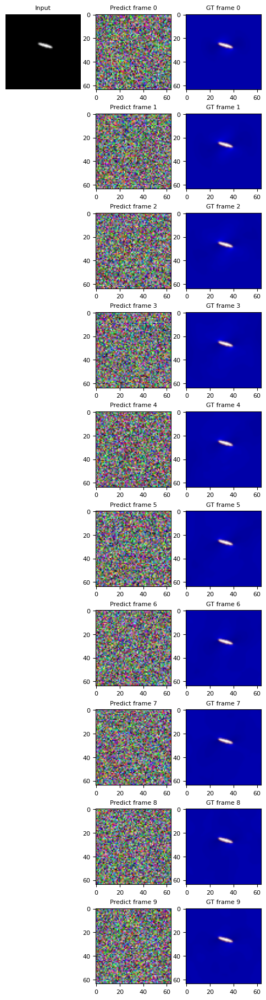

In [33]:
#test whether prediction works - since the model is not trained yet, output is just noise
validation (dynagen, testloader,num_examples=2,  )

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.43it/s]
0it [00:03, ?it/s]


(10, 2)


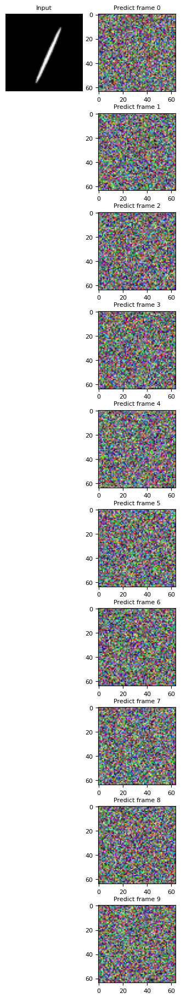

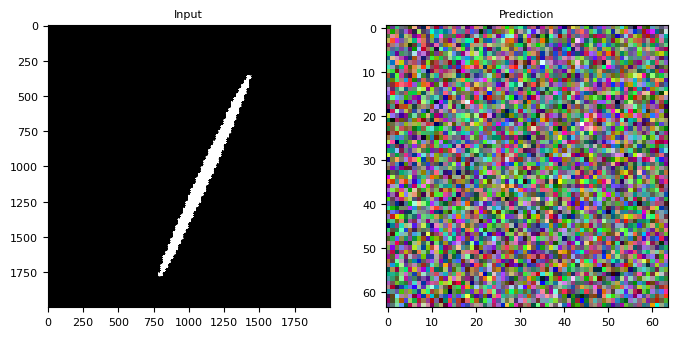

In [34]:
#test whether prediction works - since the model is not trained yet, output is just noise
input_='./dynamic_fracture_images_validation/original_00000.png'
pred = predict_from_input  (dynagen, fname=input_,unet_number=1,
                                tag=2000, im_res=im_res_step1)

## Train model

### Training is done in stages - from first to last U-net

In [35]:
#How to save and load model using trainer
#trainer1.save(f'test.pt')
#_=trainer1.load(f'test.pt')

#### Train first U-net

In [74]:
batch_size_=5
print ("Batch size: ", batch_size_, "CSV file used: ", csvfile, "Resolution: ", im_res_step1)

trainloader, testloader = ImagePairs_load_split_train_test(csvfile, .1, im_res=im_res_step1, batch_size_=5)

print ("Number of training batches: ", len(trainloader), "batch size= ", batch_size_, "total: ",len(trainloader)*batch_size_ )
print ("Number of test batches: ", len(testloader), "batch size= ", batch_size_, "total: ",len(testloader)*batch_size_)

1
.//dynamic_fracture_images/data_631_small.csv
Number of training batches:  10 batch size=  1 total:  10
Number of test batches:  2 batch size=  1 total:  2


In [75]:
## Trainer setup
trainer1 = DynaGenTrainer(dynagen, only_train_unet_number=1).to(device)


In [ ]:
num_first_unet=100
train_losses=[]
train_losses= train_epochs (dynagen,trainer1, trainloader, testloader, epochs=num_first_unet,
                    startep=0,
                iprint=10,
                 train_losses=train_losses, unet_number=1 ,max_batch_size=2 )

In [ ]:
#Load the best performing checkpoint
_=trainer1.load(f'./{prefix}/checkpoint-39_unet-1.pt')

In [ ]:
#image= predict_from_input  (fname='./DataSet_mosaic/input_mobile00067.png',unet_number=1)

#### Train second U-net

In [ ]:
trainer2 = DynaGenTrainer(dynagen, only_train_unet_number=2).to(device)

In [85]:
try: del trainer1
except: print ("No trainer1 exists")

In [ ]:
#trainer2.load(f'{prefix}/checkpoint-0_unet-2.pt')

In [ ]:
#batch_size_=5 
print ("Batch size: ", batch_size_, "CSV file used: ", csvfile, "Resolution: ", im_res_final)

trainloader, testloader = ImagePairs_load_split_train_test(csvfile, .1, im_res=im_res_final, batch_size_=5)

print ("Number of training batches: ", len(trainloader), "batch size= ", batch_size_, "total: ",len(trainloader)*batch_size_ )
print ("Number of test batches: ", len(testloader), "batch size= ", batch_size_, "total: ",len(testloader)*batch_size_)

In [ ]:
train_losses=[]

In [ ]:
num_second_unet=100

In [ ]:
train_losses= train_epochs (dynagen,trainer2, trainloader, testloader,  epochs=num_second_unet,
                    startep=0,
                iprint=10,num_examples=4,
                 train_losses=train_losses, unet_number=2,  im_res=im_res_final,max_batch_size=2,
                            save_every_iteration=False)

In [ ]:
#Load the best performing checkpoint
_=trainer2.load(f'./{prefix}/checkpoint-29_unet-2.pt')

In [ ]:
validation (dynagen, testloader,num_examples=2,  )

## Use best final model and validate

In [36]:
trainloader, testloader = ImagePairs_load_split_train_test(csvfile, .1, im_res=im_res_final, batch_size_=5)

print ("Number of training batches: ", len(trainloader), "batch size= ", batch_size_, "total: ",len(trainloader)*batch_size_ )
print ("Number of test batches: ", len(testloader), "batch size= ", batch_size_, "total: ",len(testloader)*batch_size_)

Number of training batches:  10 batch size=  1 total:  10
Number of test batches:  2 batch size=  1 total:  2


In [37]:
try: del trainer2
except: print ("No trainer2 exists")

No trainer2 exists


In [38]:
trainer2 = DynaGenTrainer(dynagen, only_train_unet_number=2).to(device)

In [39]:
#Load the best performing checkpoint
_=trainer2.load(f'./{prefix}/checkpoint-129_unet-2.pt')

DynaGen checkpoint loaded from ././dynagen_output_1//checkpoint-129_unet-2.pt


### Validate using a number of samples from the test set

Producing 5 samples...


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.36it/s]
1it [00:03,  3.58s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.02it/s]
1it [00:09,  9.01s/it]


(10, 3)


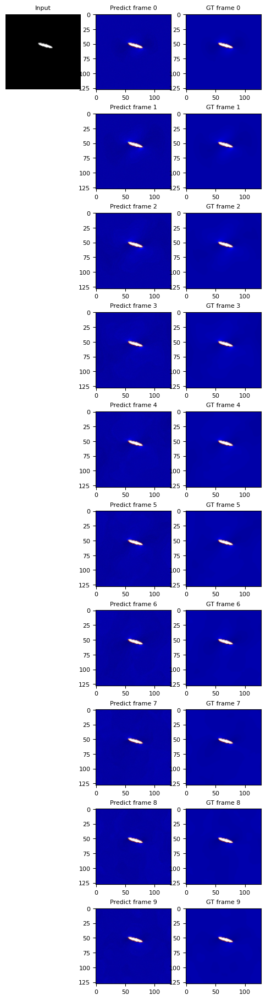

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.42it/s]
1it [00:03,  3.37s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.03it/s]
1it [00:08,  8.79s/it]


(10, 3)


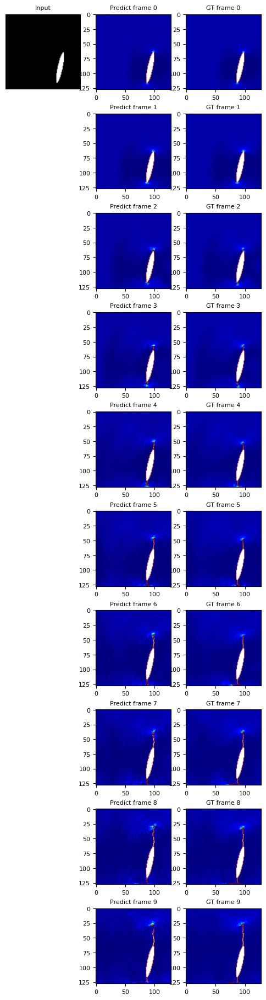

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.41it/s]
1it [00:03,  3.37s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  2.00it/s]
1it [00:08,  8.86s/it]


(10, 3)


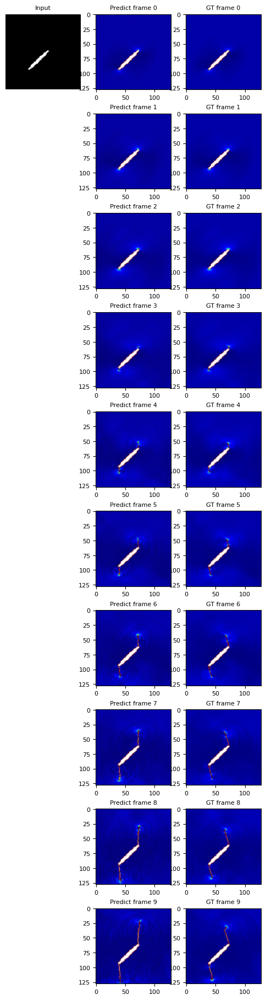

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.36it/s]
1it [00:03,  3.40s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.99it/s]
1it [00:08,  8.91s/it]


(10, 3)


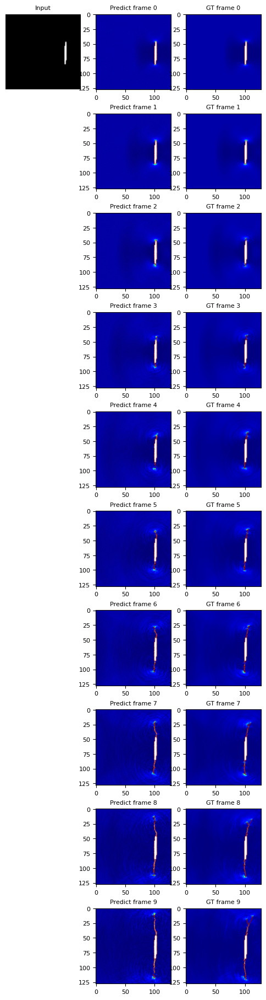

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.35it/s]
1it [00:03,  3.46s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.98it/s]
1it [00:09,  9.00s/it]


(10, 3)


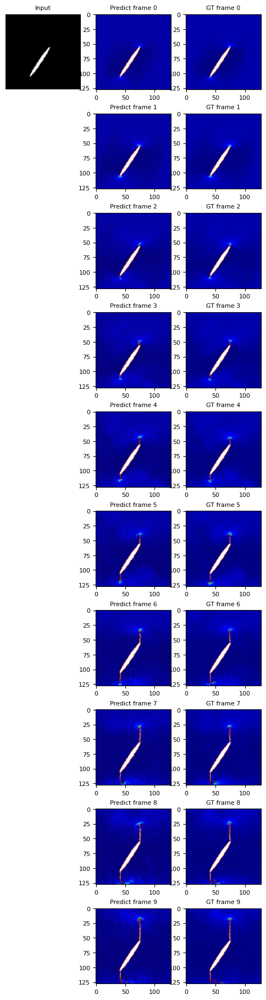

Producing 1 samples...


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.30it/s]
1it [00:03,  3.49s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.92it/s]
1it [00:09,  9.22s/it]


(10, 3)


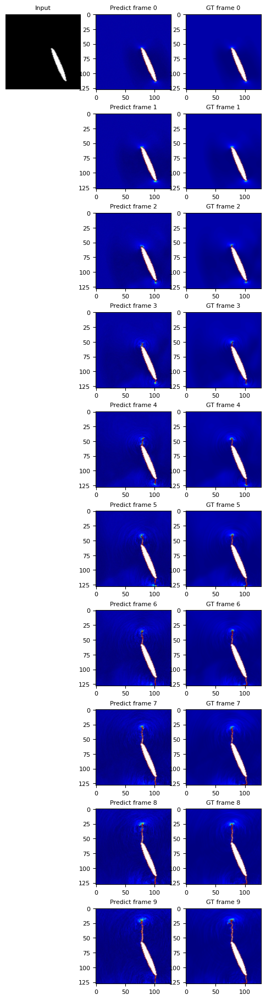

In [47]:
#no field error calculation
validation (dynagen, testloader,num_examples=6,unet_number=2  )

Producing 1 samples...


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.74it/s]
1it [00:06,  6.47s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.02it/s]
1it [00:16, 16.82s/it]


(10, 3)


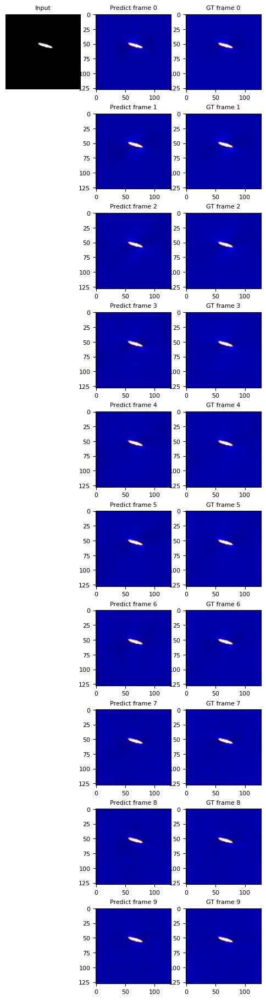

Resolution of predicted image: 128


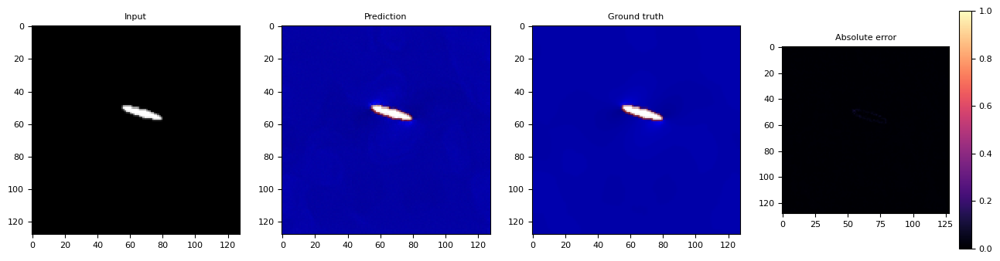

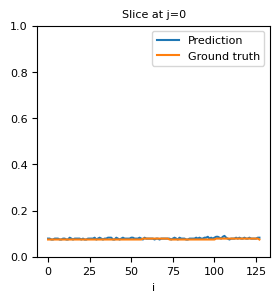

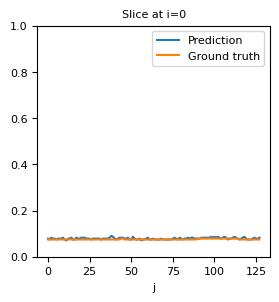

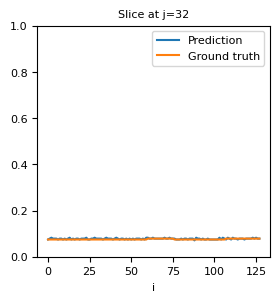

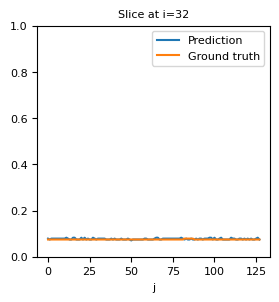

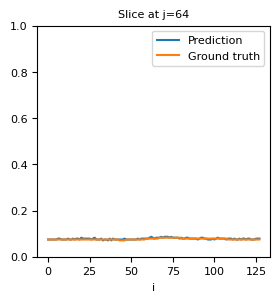

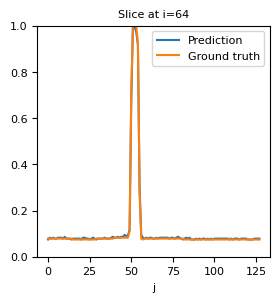

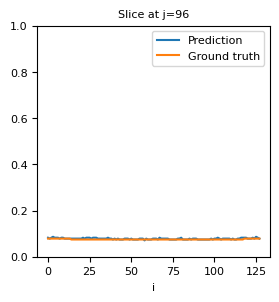

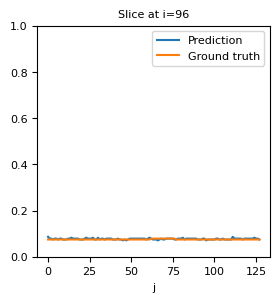

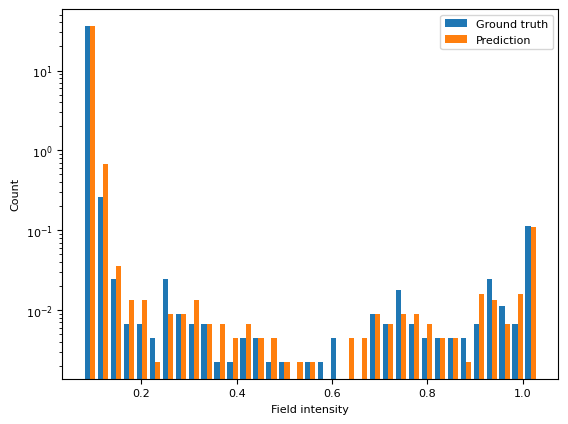

Standard dev: GT 0.06697163576266214, pred 0.06651702178344045 --- var: GR 1.143725999165305, pred 1.1282511176693664 


In [56]:
#with field error calculation, slices to plot stress values, etc.
validation (dynagen, testloader,num_examples=1,
            compare_fields=True , #compare final frame
            plotcompare_slices=True, delta_steps_disc=32,
            nbins=35,
            unet_number=2,cond_scale=1.,
           )

Producing 1 samples...


0it [00:00, ?it/s]
sampling time step: 100%|███████████████████████████████████████████████████████████████████████████████████| 7/7 [00:02<00:00,  3.39it/s]
1it [00:02,  2.71s/it]
sampling time step: 100%|███████████████████████████████████████████████████████████████████████████████████| 7/7 [00:03<00:00,  2.10it/s]
1it [00:06,  6.52s/it]


(10, 3)


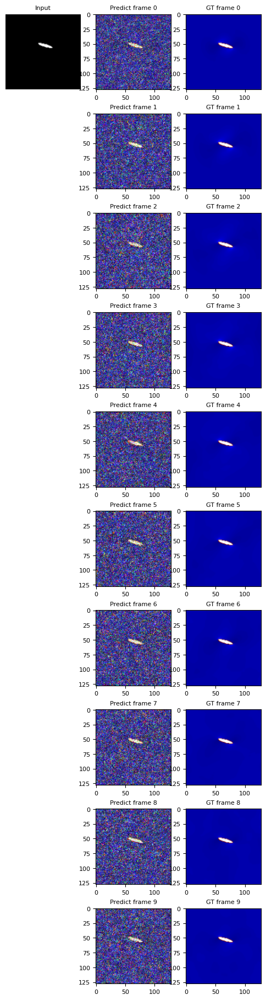

Resolution of predicted image: 128


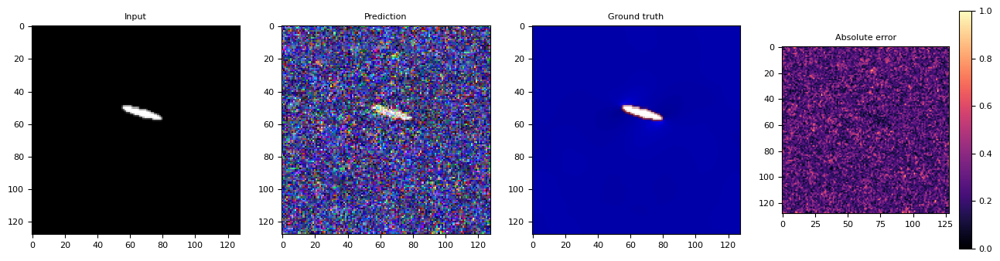

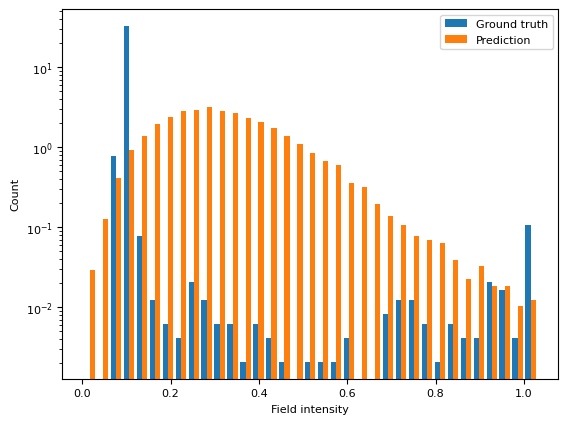

Standard dev: GT 0.06697163576266214, pred 0.14101714244148952 --- var: GT 1.143725999165305, pred 5.070887787902653 


In [106]:
#Use skip steps to skip sample steps
validation (dynagen, testloader,num_examples=1,
            compare_fields=True , #compare final frame
            plotcompare_slices=False, delta_steps_disc=32,
            nbins=35,
            unet_number=2,cond_scale=1.,
            skip_steps = 3, #how many sample steps skipped....
           )

### Validate based on microstructure images and GT solution image 

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.42it/s]
1it [00:03,  3.54s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.02it/s]
1it [00:09,  9.00s/it]


(10, 2)


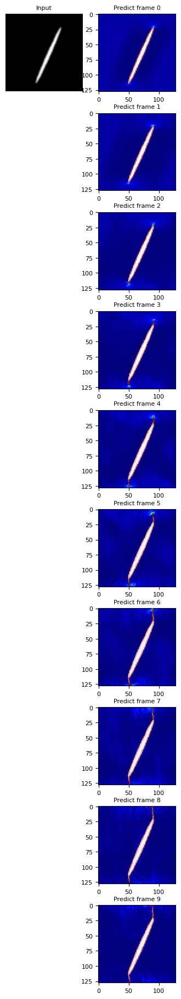

Resolution of predicted image: 128


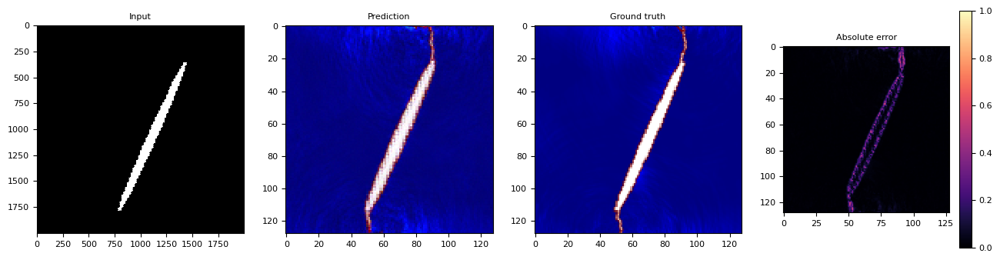

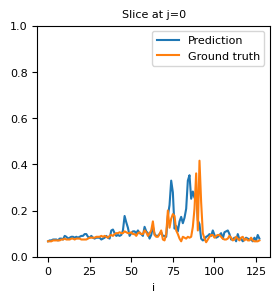

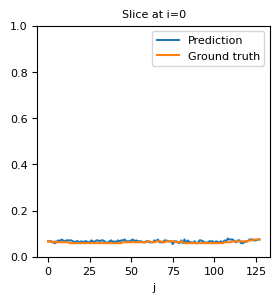

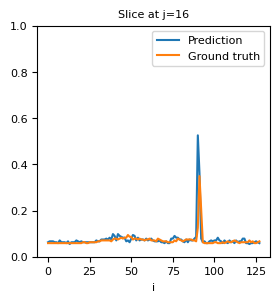

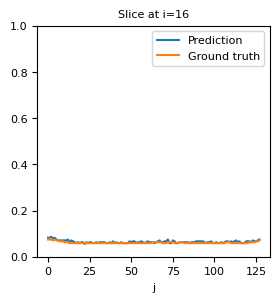

...

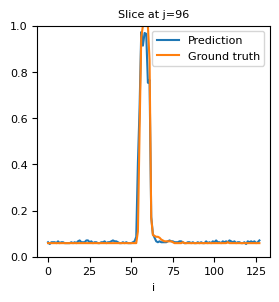

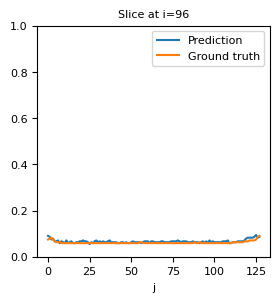

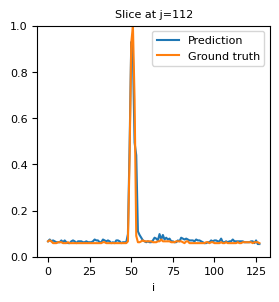

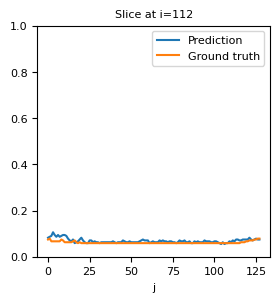

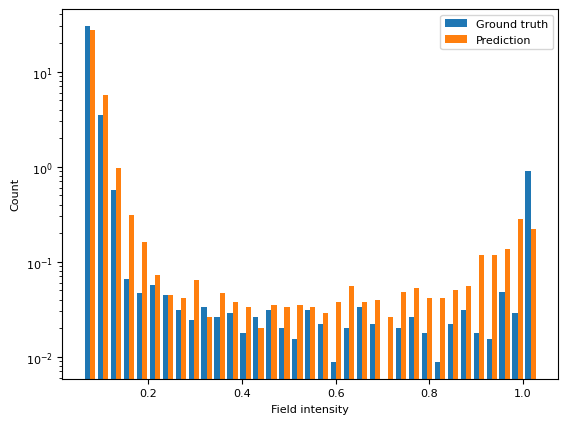

Standard dev: GT 0.16618279627399546, pred 0.15938410974729564 --- var: GR 7.042264053248291, pred 6.477840082184187 


(0.16618279627399546,
 0.15938410974729564,
 7.042264053248291,
 6.477840082184187)

In [51]:
#example where both microstructure input and GT is provided and compared
input_='./dynamic_fracture_images_validation/original_00000.png'
gt= './dynamic_fracture_images_validation/output_mobile_00000_0000009.png'
pred, gt, _ = predict_from_input  (dynagen, fname=input_,unet_number=2,gt=gt,
                                tag=2000, im_res=im_res_step1,  plotcompare=True, delta_steps_disc=16)
stat_analysis (gt, pred, nbins=35)

0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.28it/s]
1it [00:03,  3.69s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.96it/s]
1it [00:09,  9.31s/it]


(10, 2)


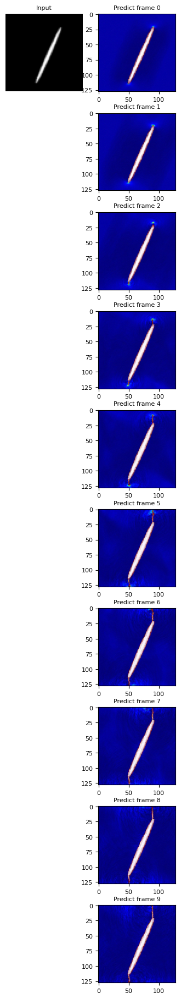

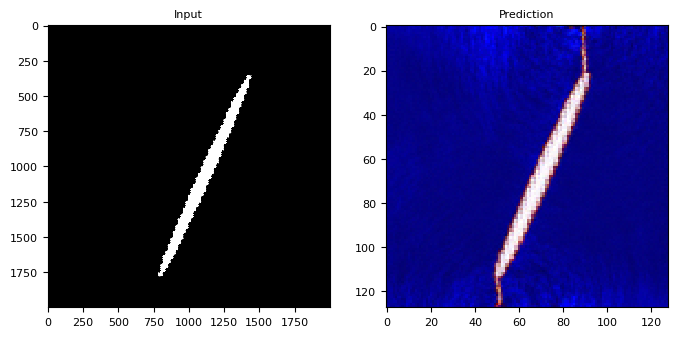

In [53]:
#Just make prediction, not GT provided
input_='./dynamic_fracture_images_validation/original_00000.png'
gt=None
pred, _ = predict_from_input  (dynagen, fname=input_,unet_number=2, gt=gt, 
                                tag=2001, im_res=im_res_step1)

### Generate correlation plots of statistical analysis

###################################################################################
########## processing i=15 of 19
###################################################################################


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.32it/s]
1it [00:03,  3.66s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.98it/s]
2it [00:09,  4.61s/it]


(10, 2)


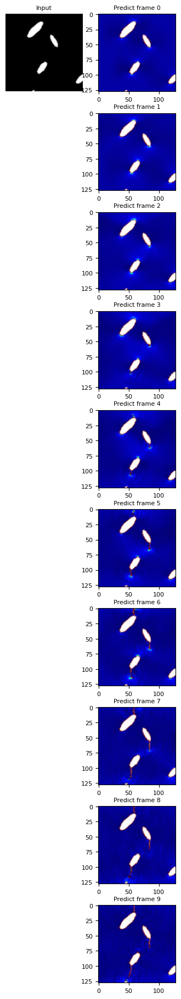

Resolution of predicted image: 128


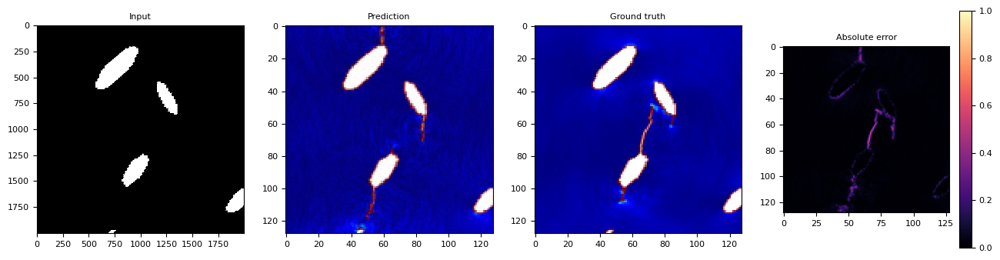

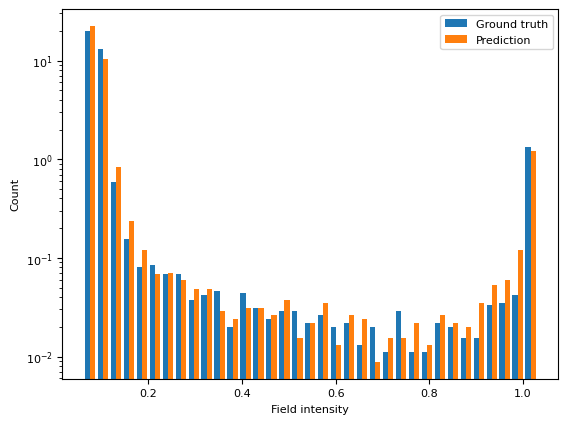

Standard dev: GT 0.19243143114214994, pred 0.19118532002878785 --- var: GT 9.44261320131108, pred 9.32071578160006 
###################################################################################
########## processing i=16 of 19
###################################################################################


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.24it/s]
1it [00:03,  3.66s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.03it/s]
2it [00:09,  4.52s/it]


(10, 2)


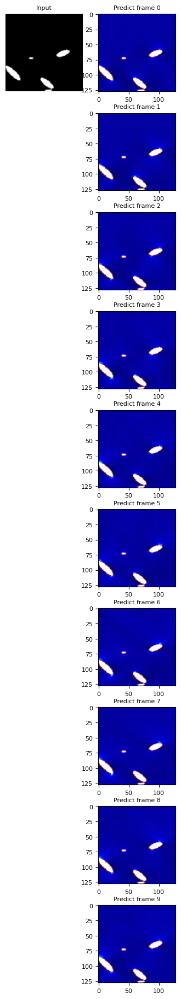

Resolution of predicted image: 128


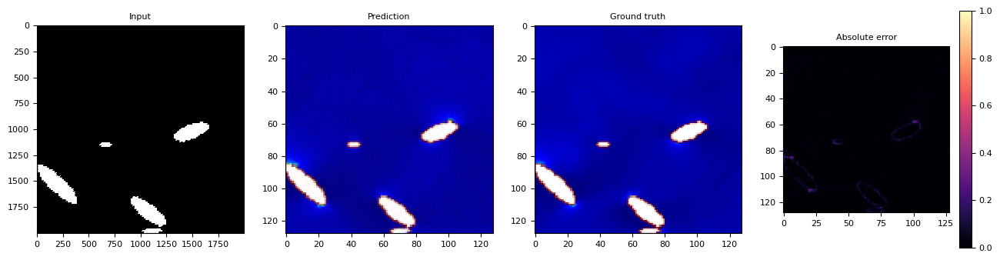

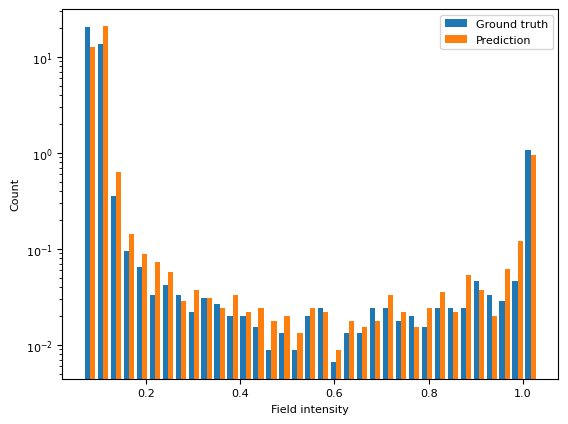

Standard dev: GT 0.17618201685506393, pred 0.1738205270059883 --- var: GT 7.915226281095098, pred 7.704461780203076 
###################################################################################
########## processing i=17 of 19
###################################################################################


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.31it/s]
1it [00:03,  3.58s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.02it/s]
2it [00:09,  4.51s/it]


(10, 2)


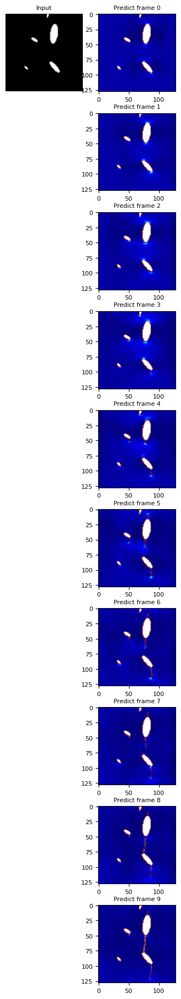

Resolution of predicted image: 128


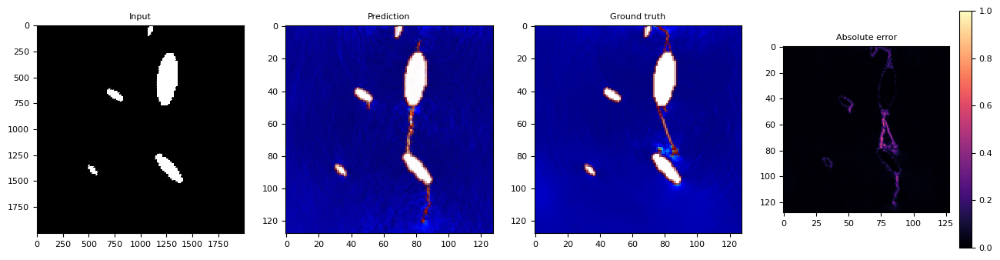

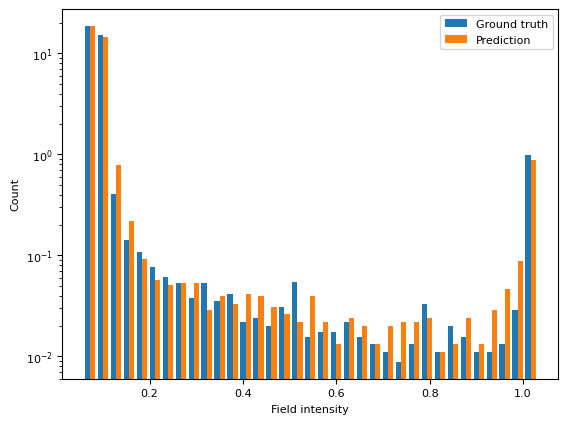

Standard dev: GT 0.16666525039197305, pred 0.16688895616803273 --- var: GT 7.083212950495864, pred 7.102240541168167 
###################################################################################
########## processing i=18 of 19
###################################################################################


0it [00:00, ?it/s]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  3.32it/s]
1it [00:03,  3.61s/it]
sampling time step: 100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.98it/s]
2it [00:09,  4.58s/it]


(10, 2)


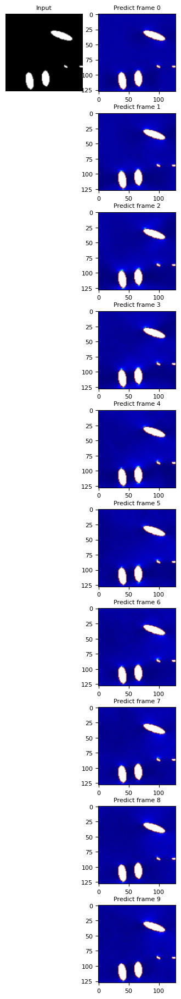

Resolution of predicted image: 128


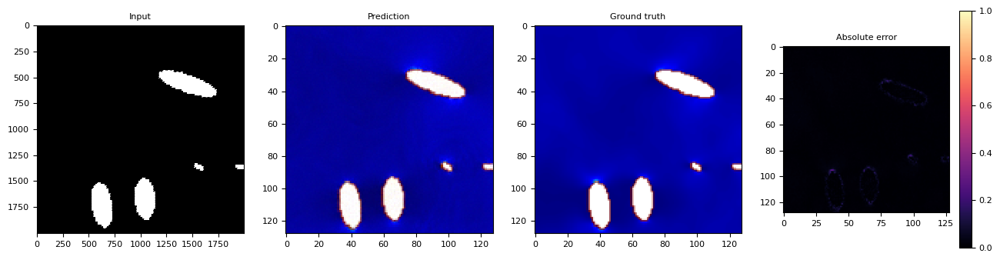

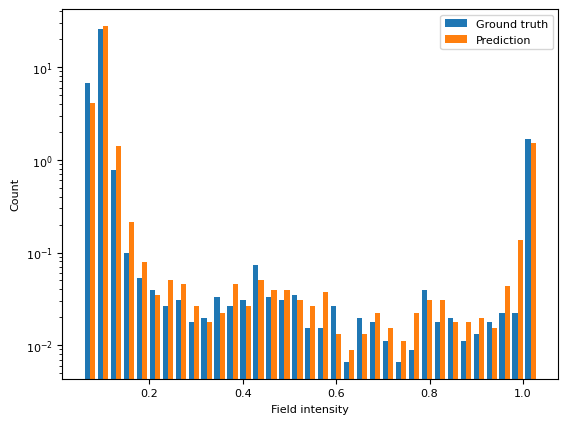

Standard dev: GT 0.20718855412379253, pred 0.20397336707658298 --- var: GT 10.946409724776466, pred 10.609309291522408 


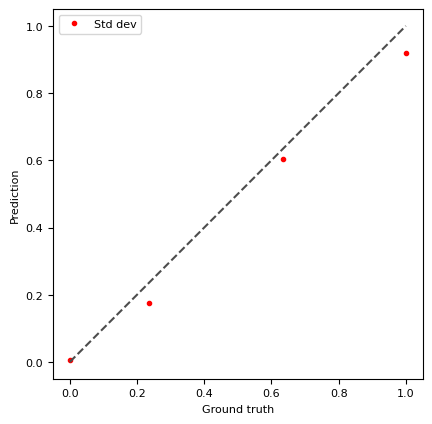

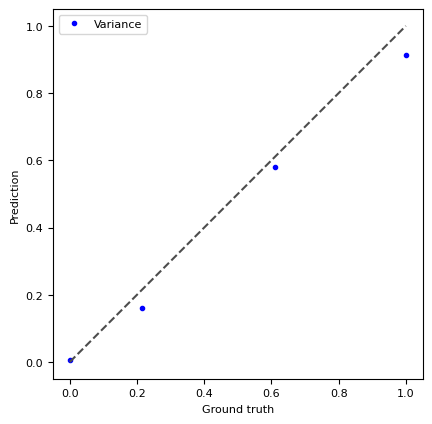

R2 std dev=0.9817523962573769, R2 var=0.9801772088348171


In [107]:
stddev_GT_list, stddev_pred_list, var_GT_list,var_pred_list,R2_stddev,R2_var=analayze_and_plot_stats (dynagen, sourcedir='dynamic_fracture_images_validation', 
                                                                    n_bins=35, istart=15, iend=19, 
                                                                    num_disc=64,plotcompare=False)